In [1]:
suppressPackageStartupMessages(library("sva"))
suppressPackageStartupMessages(library("preprocessCore"))

source("/home/olya/SFU/Hossein/pRRophetic/R/homogenize_data.R")

In [2]:
root_dir <- "/home/olya/SFU/Hossein/v2/" 
batch_correction <- "eb" # "standardize"
exprs_dir <-  paste0(root_dir,"/exprs/")
output_dir <- paste0(root_dir,"/exprs_homogenized/")

In [3]:
getBasename <- function(file, keep_path = FALSE){
    if (!keep_path) {
        file <- unlist(strsplit(file,"/"))
        file <- file[length(file)]
    }
    basename <- c(unlist(strsplit(file,".", fixed = TRUE)))
    basename <- paste(basename[seq(1,length(basename))-1],collapse=".")
    return (basename)
}

plotMDS <- function(datMat1,datMat2,label1, label2,title){
    # e.g. plotMDS(trainExprMat,testExprMat,"train","test")
    # get common rows
    common <- intersect(rownames(datMat1), rownames(datMat2))  
    datMat1 <- datMat1[common,]
    datMat2 <- datMat2[common,]
    # merge 
    dataMat <- cbind(datMat1,datMat2)
    dim(dataMat)
    whichbatch <- as.factor(c(rep(label1, ncol(datMat1)), rep(label2, ncol(datMat2))))
    # plot MDS
    mds = cmdscale(dist(t(dataMat)),eig=TRUE)
    plot(mds$points,col=as.numeric(whichbatch),pch=19,main=paste0(c("MDS ",title)),
         xlab = "Coord.1",ylab = "Coord.2" )
    legend("topright",legend = levels(whichbatch),
           fill = as.numeric(as.factor(levels(whichbatch))))
}

run_homogenization <- function(testfile, trainfile,output_dir = FALSE,batch_correction="eb"){
    ###  read files and drop NA rows 
    trainExprMat <- read.csv(trainfile,sep="\t",row.names=1,check.names=F)
    trainExprMat <- trainExprMat[rowSums(is.na(trainExprMat)) <= 0,]
    #boxplot(trainExprMat[,c(seq(1,50))] ,range=0, xlab = "Array", main = "Boxplot", ylab = "Intensity")

    testExprMat <- read.csv(testfile,sep="\t",row.names=1,check.names=F)
    # drop NA rows 
    testExprMat <- testExprMat[rowSums(is.na(testExprMat)) <= 0,]
    #boxplot(testExprMat ,range=0, xlab = "Array", main = "Boxplot", ylab = "Intensity")

    ###  get common rows 
    #common <- intersect(rownames(trainExprMat ), rownames(testExprMat ))  
    #trainExprMat <- trainExprMat[common,]
    #testExprMat <- testExprMat[common,]
    
    ### homogenize 
    homData <- homogenizeData(as.matrix(testExprMat), as.matrix(trainExprMat), 
                              batchCorrect=batch_correction, selection=-1, printOutput=TRUE)
    
    ### Plot MDS before and after homogenization 
    options(repr.plot.width = 20, repr.plot.height = 8)
    par(mfrow=c(1,2))
    title <- paste0(getBasename(testfile),"+",getBasename(trainfile)," ","before")
    plotMDS(trainExprMat,testExprMat,"train","test",title)
    title <- paste0(getBasename(testfile),"+",getBasename(trainfile)," ","after")
    plotMDS(homData$train,homData$test,"train","test",title)
    
    ### hierarchical clustering of testing sample before and after homogenization  
    #par(mfrow=c(2,1),cex.axis = 0.5,mai=c(0.0,0.8,0.8,0.4))
    #tree <- hclust(dist(t(testExprMat)), method="average")
    #plot(tree, main = "before",xlab = "")
    #tree <- hclust(dist(t(homData$test)), method="average")
    #plot(tree, main = "after",xlab = "")
    
    homData$train <- cbind("ENTREZID" = rownames(homData$train), homData$train)
    homData$test <- cbind("ENTREZID" = rownames(homData$test), homData$test)
    ### write output 
    if (output_dir != FALSE){
     test_output <- paste0(output_dir,getBasename(testfile),".",batch_correction,"_with.",getBasename(trainfile),".tsv")
     train_output <- paste0(output_dir,getBasename(trainfile),".",batch_correction,"_with.",getBasename(testfile),".tsv")
     print(c("write results to ",test_output,train_output))
     write.table(homData$train, file = train_output,na="",quote = FALSE,sep="\t",row.names = FALSE)
     write.table(homData$test, file = test_output,na="",quote = FALSE,sep="\t",row.names = FALSE)   
    }
    return (homData)
}

[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.EGFRi.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.EGFRi.tsv"

 18232  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                        
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.EGFRi.eb_with.GDSC_exprs.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.EGFRi.eb_with.PDX_exprs.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.EGFRi.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.EGFRi.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.EGFRi.eb_with.GDSC_exprs.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.EGFRi.eb_with.TCGA_exprs.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/CCLE_exprs.EGFRi.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.EGFRi.tsv"

 17088  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



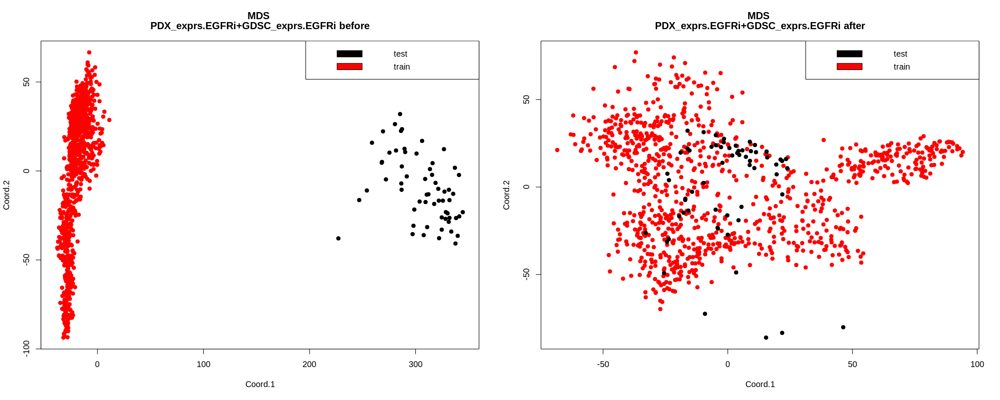

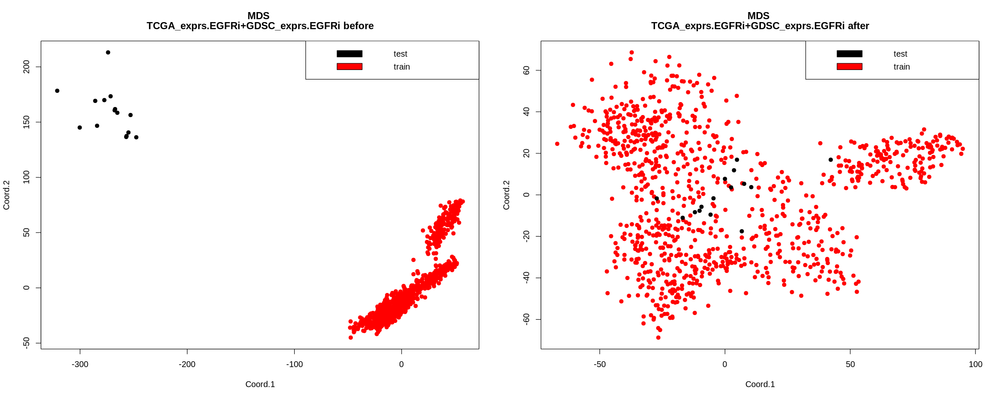

[1] "write results to "                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/CCLE_exprs.EGFRi.eb_with.GDSC_exprs.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.EGFRi.eb_with.CCLE_exprs.EGFRi.tsv"


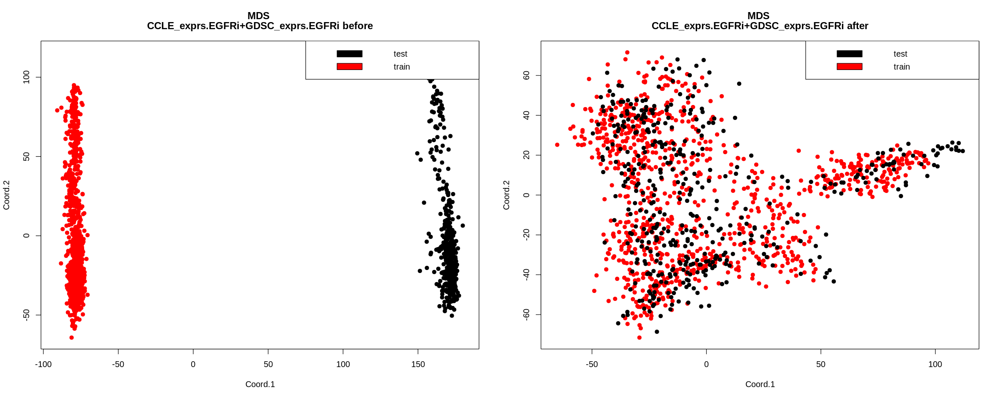

In [5]:
pairs <- list(list("PDX_exprs.EGFRi.tsv","GDSC_exprs.EGFRi.tsv"),
            list("TCGA_exprs.EGFRi.tsv","GDSC_exprs.EGFRi.tsv"),
              list("CCLE_exprs.EGFRi.tsv","GDSC_exprs.EGFRi.tsv")
             )

for(pair in pairs){
  testfile <-  paste0(exprs_dir, pair[1])
  trainfile <- paste0(exprs_dir, pair[2])
  print(c(testfile, trainfile))
  homData <-  run_homogenization(testfile, trainfile,
                                 output_dir = output_dir,batch_correction=batch_correction)
}

[1] "/home/olya/SFU/Hossein/v2//exprs/GSE6434_exprs.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Docetaxel.tsv"   

 8257  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                                    
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE6434_exprs.Docetaxel.eb_with.GDSC_exprs.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Docetaxel.eb_with.GSE6434_exprs.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE18864_exprs.Cisplatin.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Cisplatin.tsv"    

 17088  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE18864_exprs.Cisplatin.eb_with.GDSC_exprs.Cisplatin.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Cisplatin.eb_with.GSE18864_exprs.Cisplatin.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE25065_exprs.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Docetaxel.tsv"    

 11820  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



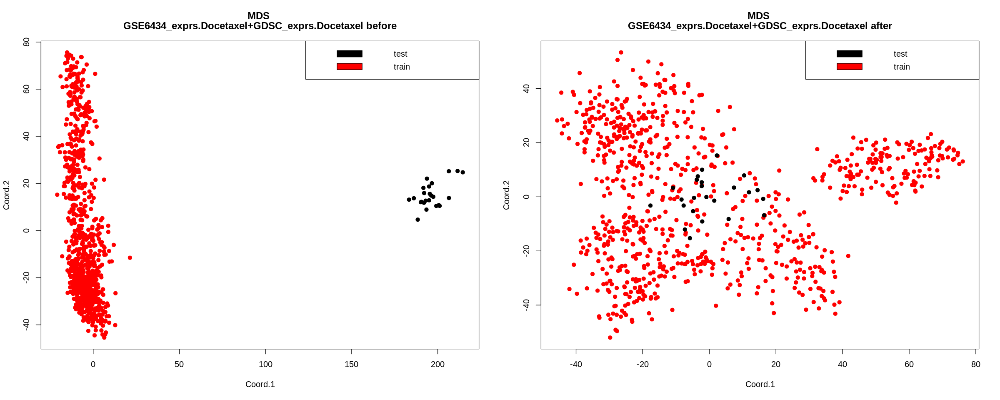

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE25065_exprs.Docetaxel.eb_with.GDSC_exprs.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Docetaxel.eb_with.GSE25065_exprs.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE25065_exprs.Paclitaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Paclitaxel.tsv"    

 11820  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



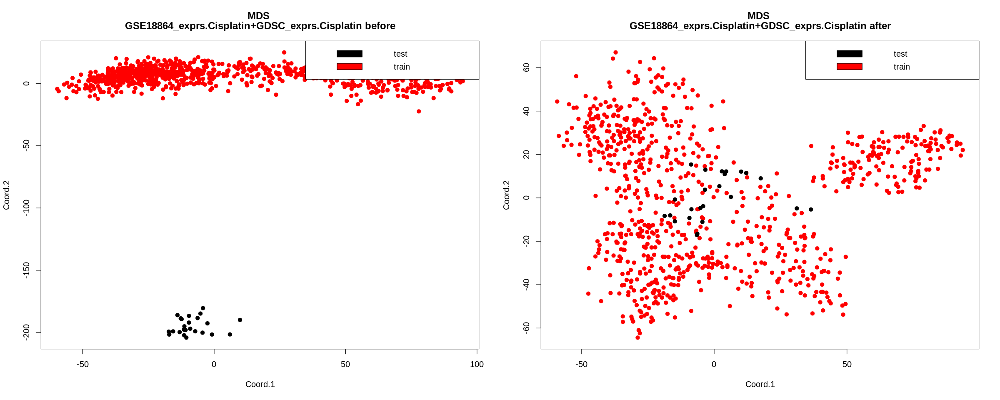

[1] "write results to "                                                                                       
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE25065_exprs.Paclitaxel.eb_with.GDSC_exprs.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Paclitaxel.eb_with.GSE25065_exprs.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE9782-GPL96_exprs.Bortezomib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Bortezomib.tsv"         

 11636  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



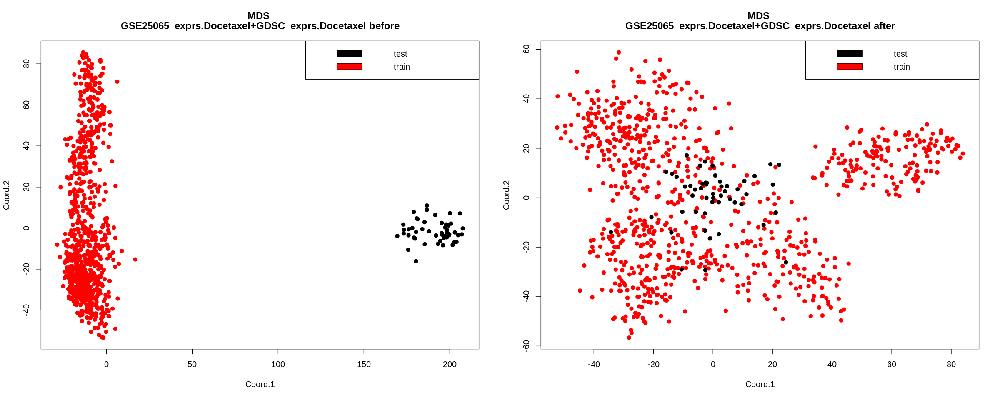

[1] "write results to "                                                                                            
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE9782-GPL96_exprs.Bortezomib.eb_with.GDSC_exprs.Bortezomib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Bortezomib.eb_with.GSE9782-GPL96_exprs.Bortezomib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE9782-GPL97_exprs.Bortezomib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Bortezomib.tsv"         

 7752  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



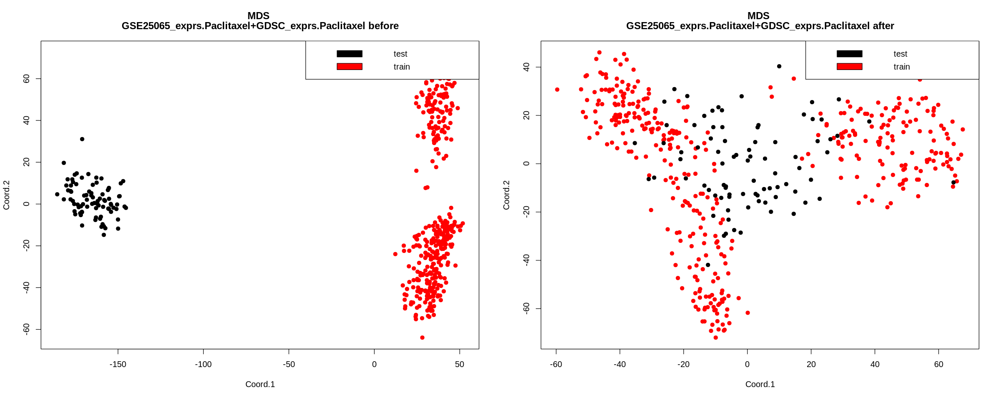

[1] "write results to "                                                                                            
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE9782-GPL97_exprs.Bortezomib.eb_with.GDSC_exprs.Bortezomib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Bortezomib.eb_with.GSE9782-GPL97_exprs.Bortezomib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE33072_exprs.Erlotinib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Erlotinib.tsv"    

 18064  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



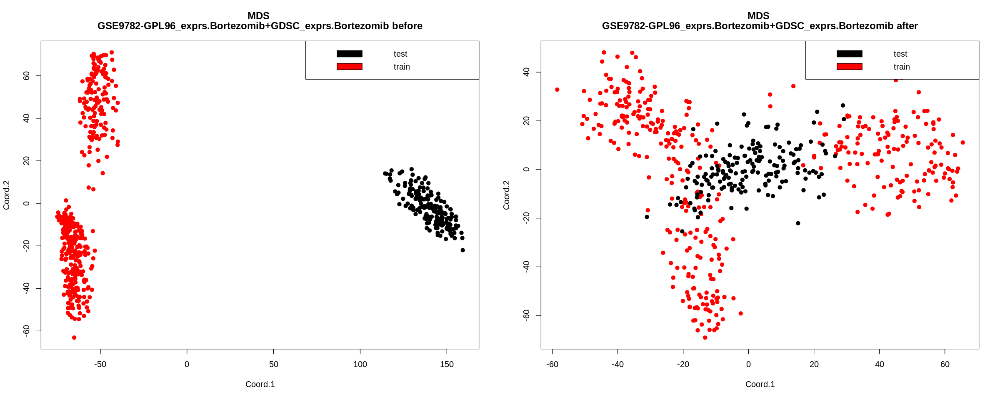

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE33072_exprs.Erlotinib.eb_with.GDSC_exprs.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Erlotinib.eb_with.GSE33072_exprs.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.EGFRi.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.EGFRi.tsv"

 18232  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



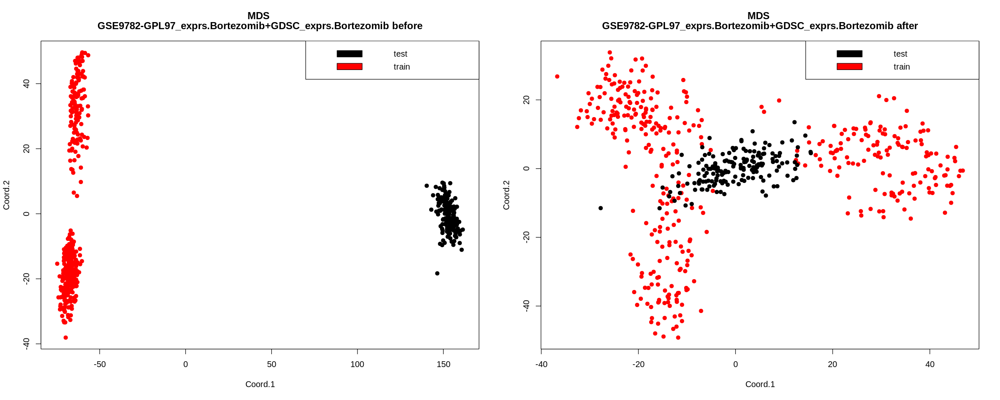

[1] "write results to "                                                                        
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.EGFRi.eb_with.GDSC_exprs.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.EGFRi.eb_with.PDX_exprs.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.EGFRi.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.EGFRi.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



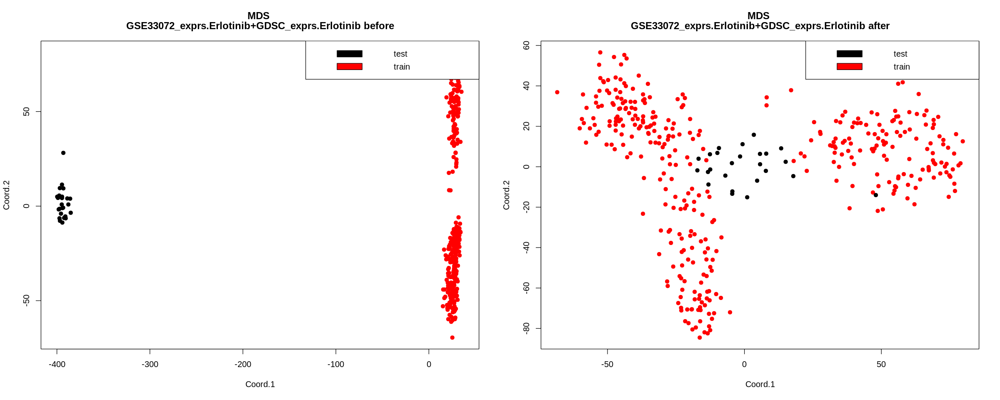

[1] "write results to "                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.EGFRi.eb_with.GDSC_exprs.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.EGFRi.eb_with.TCGA_exprs.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Gemcitabine.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Gemcitabine.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



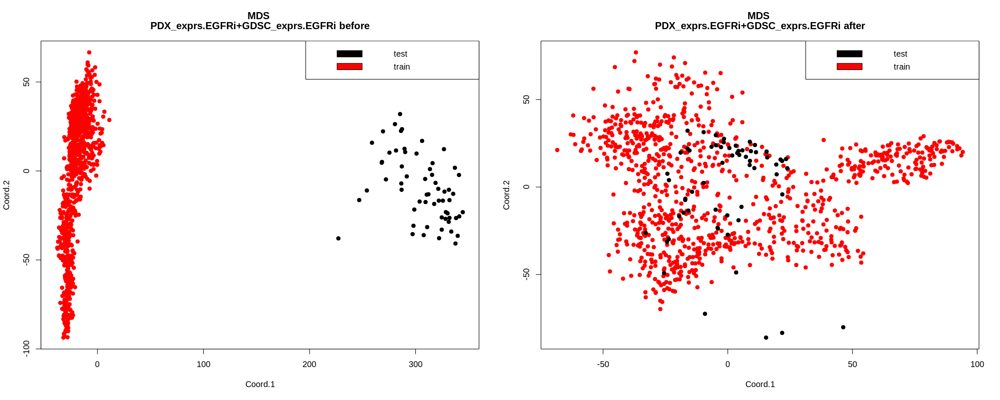

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Gemcitabine.eb_with.GDSC_exprs.Gemcitabine.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Gemcitabine.eb_with.TCGA_exprs.Gemcitabine.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.Paclitaxel.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Paclitaxel.tsv"

 18232  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



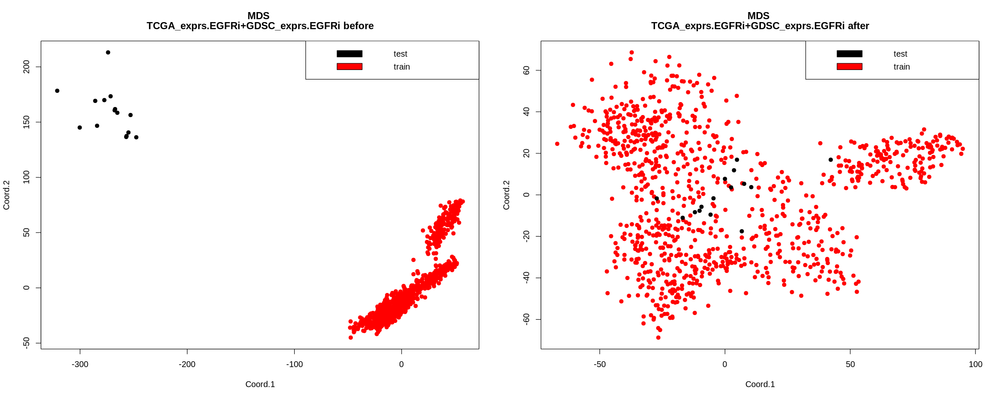

[1] "write results to "                                                                                  
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.Paclitaxel.eb_with.GDSC_exprs.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Paclitaxel.eb_with.PDX_exprs.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.Gemcitabine.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Gemcitabine.tsv"

 18232  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



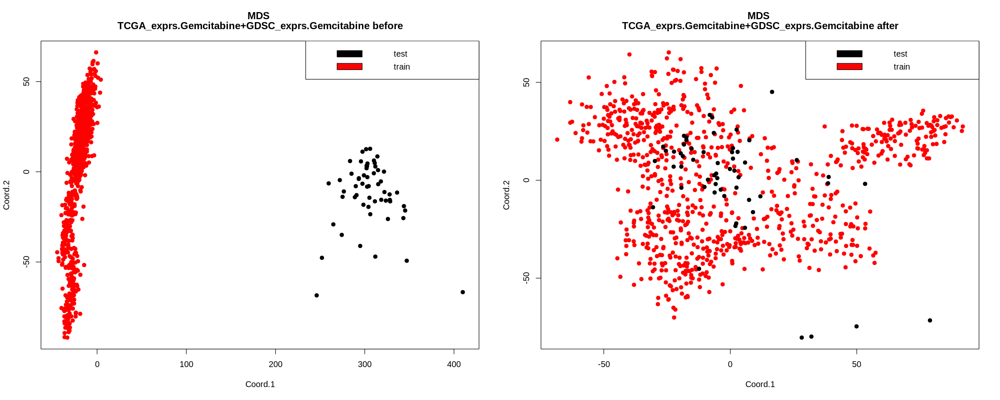

[1] "write results to "                                                                                    
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.Gemcitabine.eb_with.GDSC_exprs.Gemcitabine.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Gemcitabine.eb_with.PDX_exprs.Gemcitabine.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.Erlotinib.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Erlotinib.tsv"

 18232  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



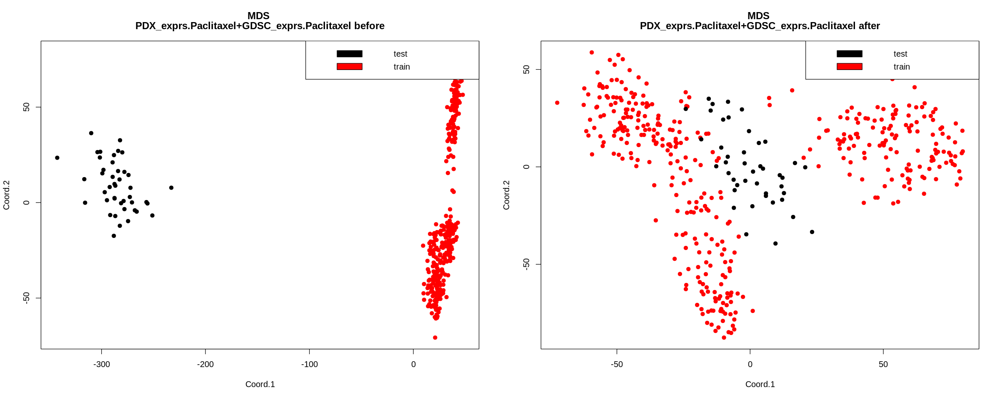

[1] "write results to "                                                                                
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.Erlotinib.eb_with.GDSC_exprs.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Erlotinib.eb_with.PDX_exprs.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Erlotinib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Erlotinib.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



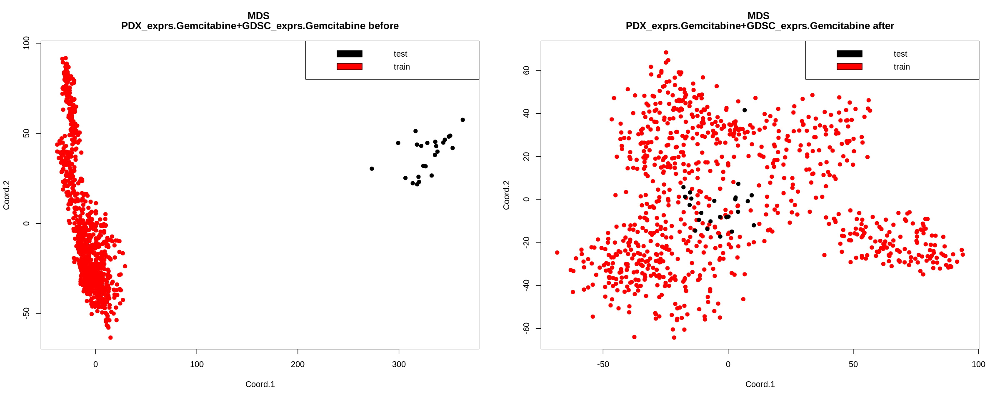

[1] "write results to "                                                                                 
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Erlotinib.eb_with.GDSC_exprs.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Erlotinib.eb_with.TCGA_exprs.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Docetaxel.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



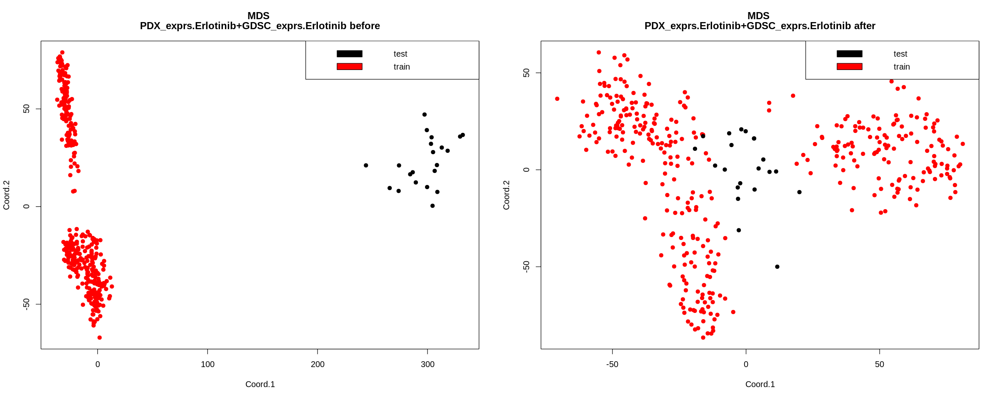

[1] "write results to "                                                                                 
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Docetaxel.eb_with.GDSC_exprs.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Docetaxel.eb_with.TCGA_exprs.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Cetuximab.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Cetuximab.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



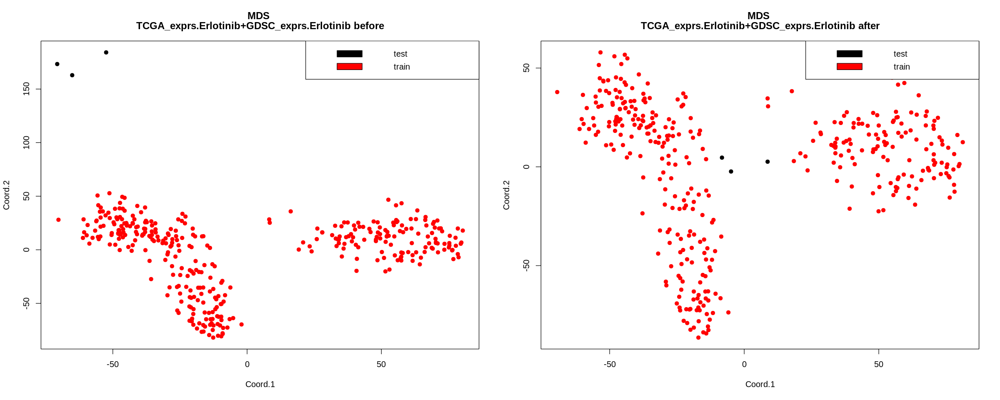

[1] "write results to "                                                                                 
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Cetuximab.eb_with.GDSC_exprs.Cetuximab.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Cetuximab.eb_with.TCGA_exprs.Cetuximab.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Cisplatin.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Cisplatin.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



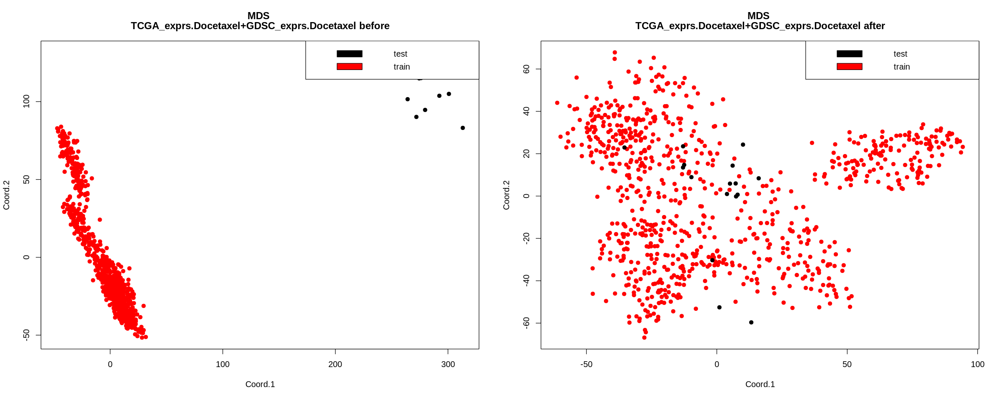

[1] "write results to "                                                                                 
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Cisplatin.eb_with.GDSC_exprs.Cisplatin.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Cisplatin.eb_with.TCGA_exprs.Cisplatin.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Tamoxifen.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Tamoxifen.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



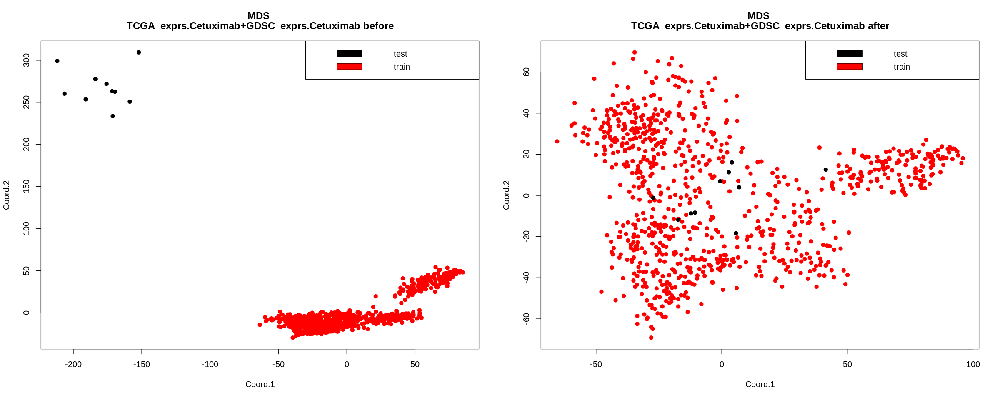

[1] "write results to "                                                                                 
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Tamoxifen.eb_with.GDSC_exprs.Tamoxifen.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Tamoxifen.eb_with.TCGA_exprs.Tamoxifen.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Paclitaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Paclitaxel.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



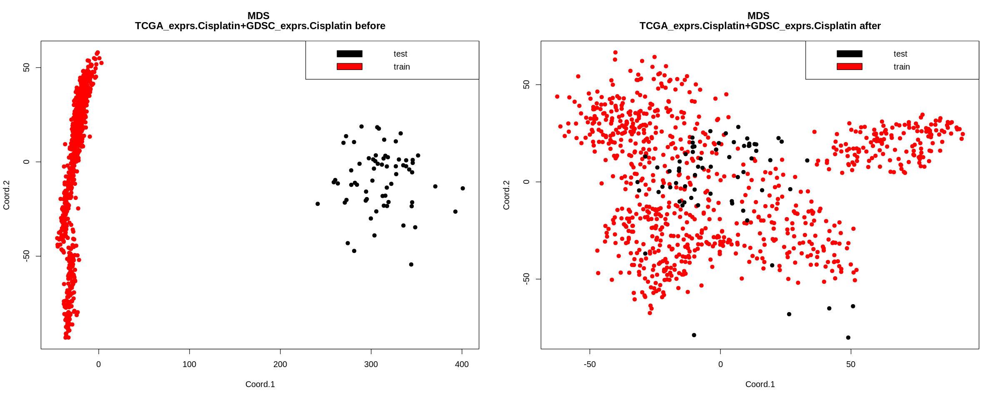

[1] "write results to "                                                                                   
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Paclitaxel.eb_with.GDSC_exprs.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Paclitaxel.eb_with.TCGA_exprs.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.Gemcitabine.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.Gemcitabine.tsv"

 18216  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



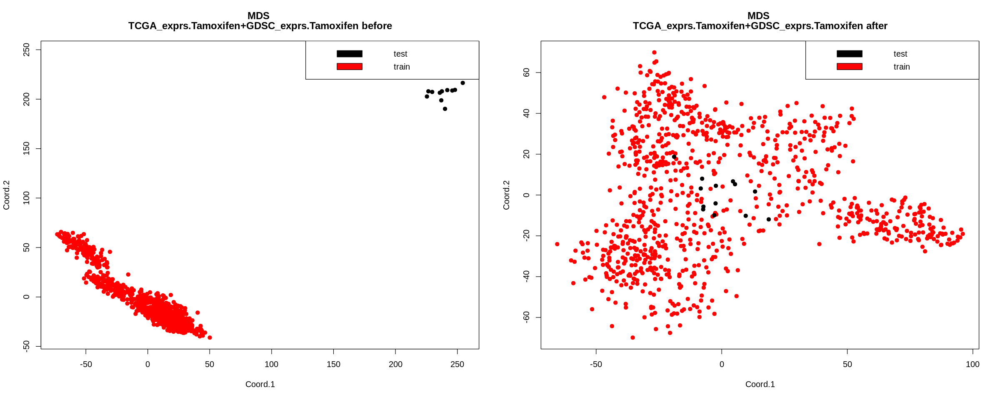

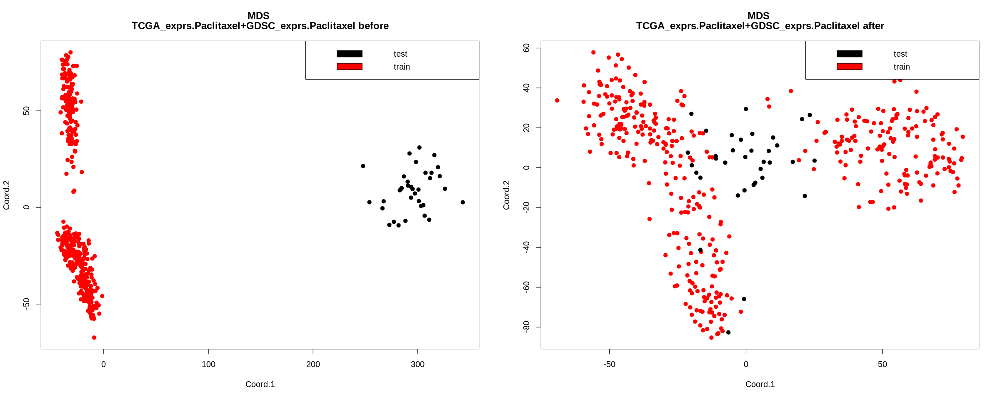

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.Gemcitabine.eb_with.GDSC_exprs.Gemcitabine.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.Gemcitabine.eb_with.TCGA_exprs.Gemcitabine.tsv"


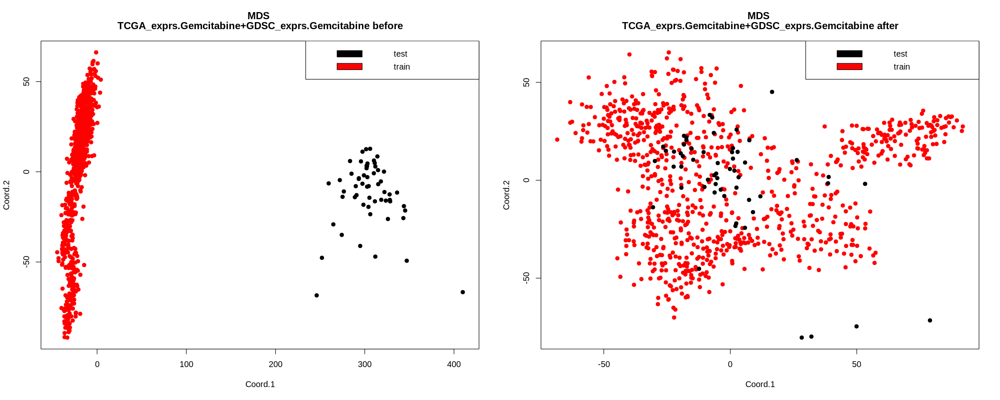

In [5]:
pairs <- list(list("GSE6434_exprs.Docetaxel.tsv","GDSC_exprs.Docetaxel.tsv"),
            list("GSE18864_exprs.Cisplatin.tsv","GDSC_exprs.Cisplatin.tsv"),
            list("GSE25065_exprs.Docetaxel.tsv","GDSC_exprs.Docetaxel.tsv"),
            list("GSE25065_exprs.Paclitaxel.tsv","GDSC_exprs.Paclitaxel.tsv"),
            list("GSE9782-GPL96_exprs.Bortezomib.tsv","GDSC_exprs.Bortezomib.tsv"),
            list("GSE9782-GPL97_exprs.Bortezomib.tsv","GDSC_exprs.Bortezomib.tsv"),
            list("GSE33072_exprs.Erlotinib.tsv","GDSC_exprs.Erlotinib.tsv"),
            list("PDX_exprs.EGFRi.tsv","GDSC_exprs.EGFRi.tsv"),
            list("TCGA_exprs.EGFRi.tsv","GDSC_exprs.EGFRi.tsv"),
            list("PDX_exprs.Paclitaxel.tsv","GDSC_exprs.Paclitaxel.tsv"),
            list("PDX_exprs.Gemcitabine.tsv","GDSC_exprs.Gemcitabine.tsv"),
            list("PDX_exprs.Erlotinib.tsv","GDSC_exprs.Erlotinib.tsv"),
            list("TCGA_exprs.Erlotinib.tsv","GDSC_exprs.Erlotinib.tsv"),
            list("TCGA_exprs.Docetaxel.tsv","GDSC_exprs.Docetaxel.tsv"),
            list("TCGA_exprs.Cetuximab.tsv","GDSC_exprs.Cetuximab.tsv"),
            list("TCGA_exprs.Cisplatin.tsv","GDSC_exprs.Cisplatin.tsv"),
            list("TCGA_exprs.Tamoxifen.tsv","GDSC_exprs.Tamoxifen.tsv"),
            list("TCGA_exprs.Paclitaxel.tsv","GDSC_exprs.Paclitaxel.tsv"),
            list("TCGA_exprs.Gemcitabine.tsv","GDSC_exprs.Gemcitabine.tsv")
             )

for(pair in pairs){
  testfile <-  paste0(exprs_dir, pair[1])
  trainfile <- paste0(exprs_dir, pair[2])
  print(c(testfile, trainfile))
  homData <-  run_homogenization(testfile, trainfile,
                                 output_dir = output_dir,batch_correction=batch_correction)
}

[1] "/home/olya/SFU/Hossein/v2//exprs/GSE6434_exprs.z.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Docetaxel.tsv"   

 8257  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                                        
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE6434_exprs.z.Docetaxel.eb_with.GDSC_exprs.z.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Docetaxel.eb_with.GSE6434_exprs.z.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE18864_exprs.z.Cisplatin.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Cisplatin.tsv"    

 17088  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



[1] "write results to "                                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE18864_exprs.z.Cisplatin.eb_with.GDSC_exprs.z.Cisplatin.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Cisplatin.eb_with.GSE18864_exprs.z.Cisplatin.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE25065_exprs.z.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Docetaxel.tsv"    

 11820  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



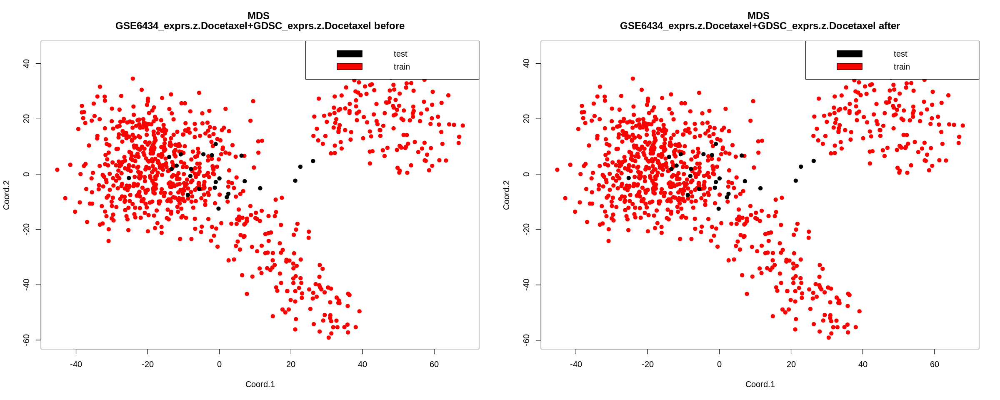

[1] "write results to "                                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE25065_exprs.z.Docetaxel.eb_with.GDSC_exprs.z.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Docetaxel.eb_with.GSE25065_exprs.z.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE25065_exprs.z.Paclitaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Paclitaxel.tsv"    

 11820  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



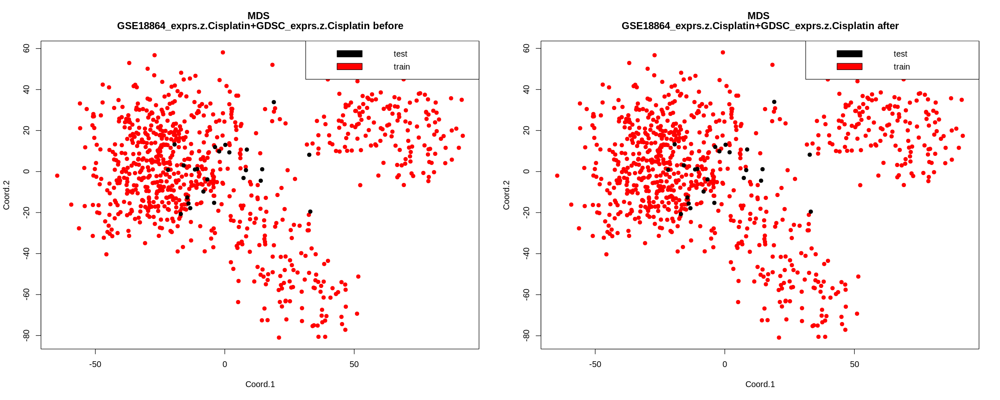

[1] "write results to "                                                                                           
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE25065_exprs.z.Paclitaxel.eb_with.GDSC_exprs.z.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Paclitaxel.eb_with.GSE25065_exprs.z.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE9782-GPL96_exprs.z.Bortezomib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Bortezomib.tsv"         

 11636  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



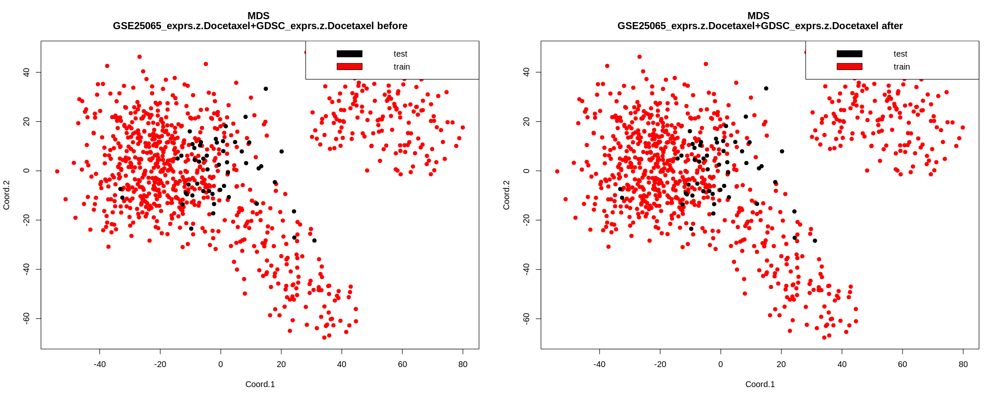

[1] "write results to "                                                                                                
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE9782-GPL96_exprs.z.Bortezomib.eb_with.GDSC_exprs.z.Bortezomib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Bortezomib.eb_with.GSE9782-GPL96_exprs.z.Bortezomib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE9782-GPL97_exprs.z.Bortezomib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Bortezomib.tsv"         

 7752  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



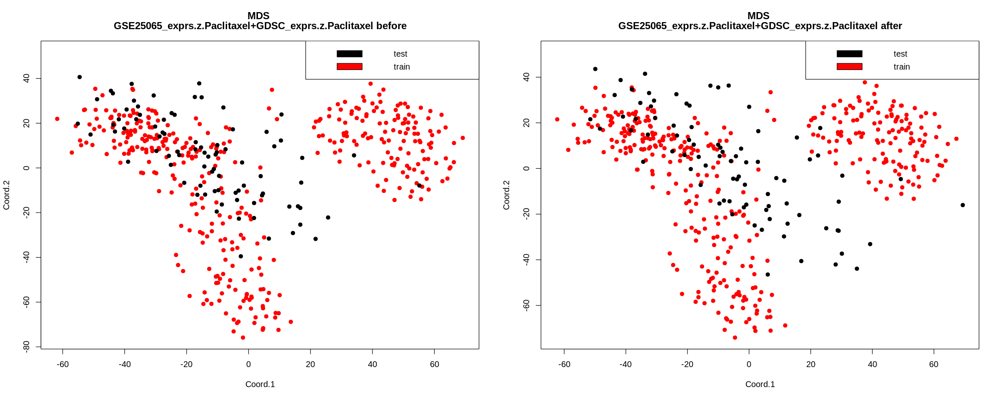

[1] "write results to "                                                                                                
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE9782-GPL97_exprs.z.Bortezomib.eb_with.GDSC_exprs.z.Bortezomib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Bortezomib.eb_with.GSE9782-GPL97_exprs.z.Bortezomib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/GSE33072_exprs.z.Erlotinib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Erlotinib.tsv"    

 18064  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



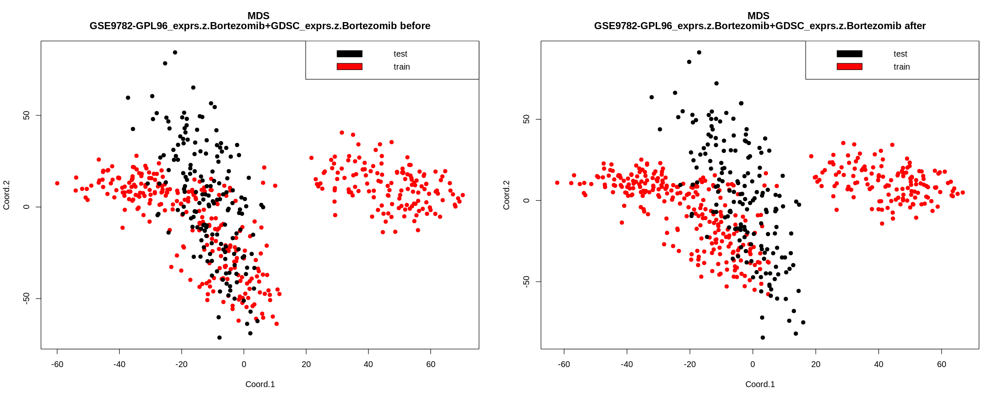

[1] "write results to "                                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GSE33072_exprs.z.Erlotinib.eb_with.GDSC_exprs.z.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Erlotinib.eb_with.GSE33072_exprs.z.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.z.EGFRi.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.EGFRi.tsv"

 18119  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



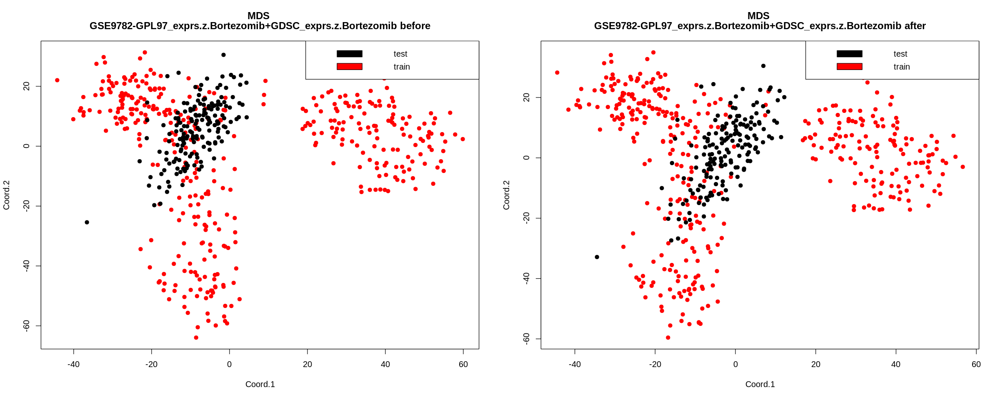

[1] "write results to "                                                                            
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.z.EGFRi.eb_with.GDSC_exprs.z.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.EGFRi.eb_with.PDX_exprs.z.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.EGFRi.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.EGFRi.tsv"

 18141  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



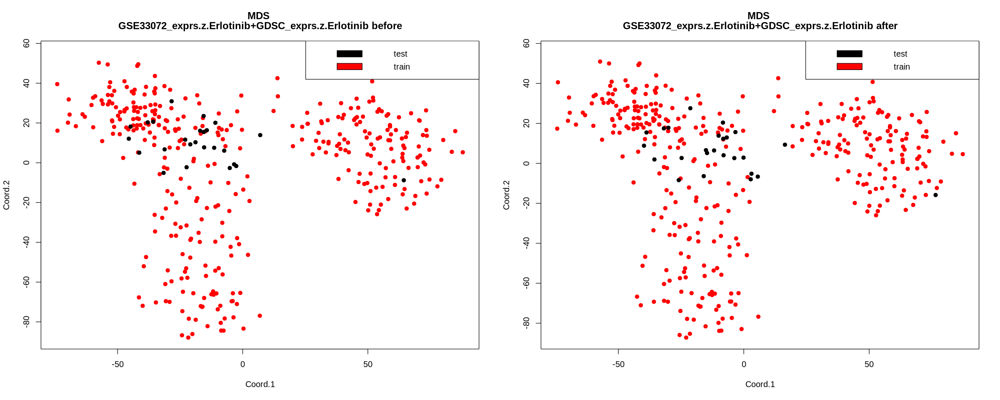

[1] "write results to "                                                                             
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.EGFRi.eb_with.GDSC_exprs.z.EGFRi.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.EGFRi.eb_with.TCGA_exprs.z.EGFRi.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.z.Paclitaxel.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Paclitaxel.tsv"

 18119  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



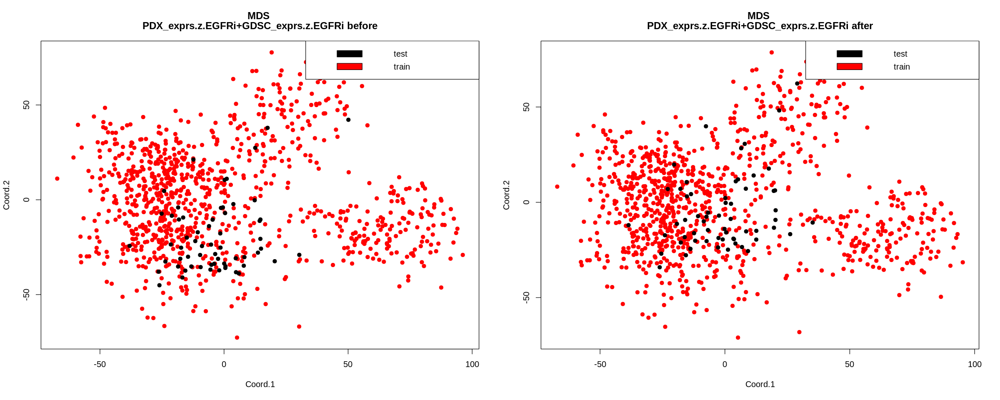

[1] "write results to "                                                                                      
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.z.Paclitaxel.eb_with.GDSC_exprs.z.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Paclitaxel.eb_with.PDX_exprs.z.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.z.Gemcitabine.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Gemcitabine.tsv"

 18119  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



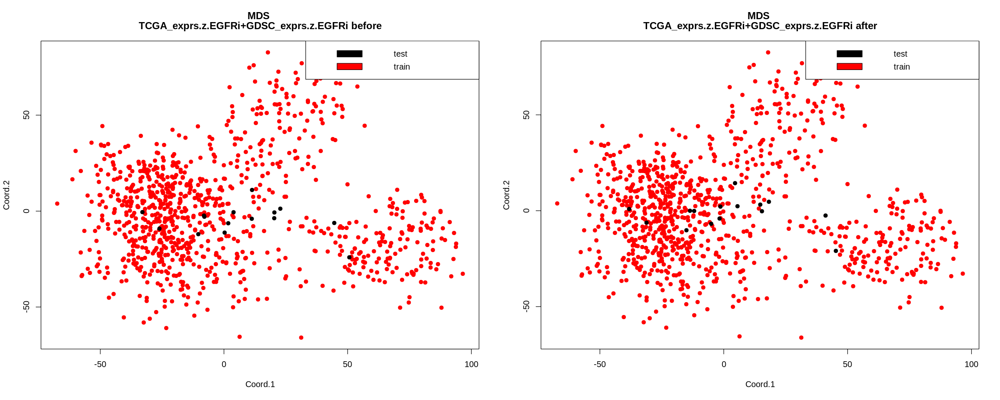

[1] "write results to "                                                                                        
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.z.Gemcitabine.eb_with.GDSC_exprs.z.Gemcitabine.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Gemcitabine.eb_with.PDX_exprs.z.Gemcitabine.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/PDX_exprs.z.Erlotinib.tsv" 
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Erlotinib.tsv"

 18119  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



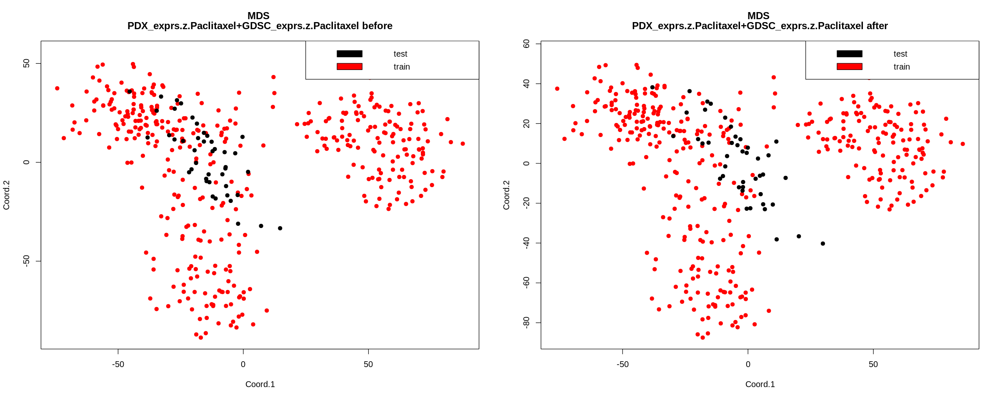

[1] "write results to "                                                                                    
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/PDX_exprs.z.Erlotinib.eb_with.GDSC_exprs.z.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Erlotinib.eb_with.PDX_exprs.z.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Erlotinib.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Erlotinib.tsv"

 18145  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



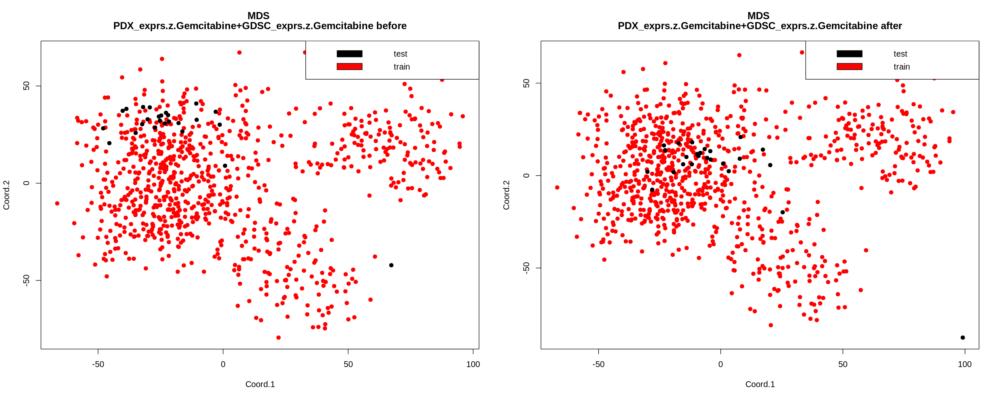

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Erlotinib.eb_with.GDSC_exprs.z.Erlotinib.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Erlotinib.eb_with.TCGA_exprs.z.Erlotinib.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Docetaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Docetaxel.tsv"

 18119  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



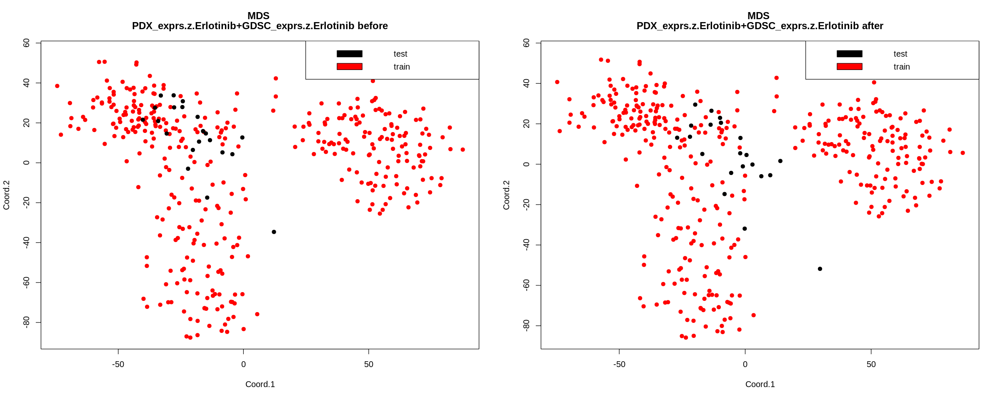

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Docetaxel.eb_with.GDSC_exprs.z.Docetaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Docetaxel.eb_with.TCGA_exprs.z.Docetaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Cetuximab.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Cetuximab.tsv"

 18194  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



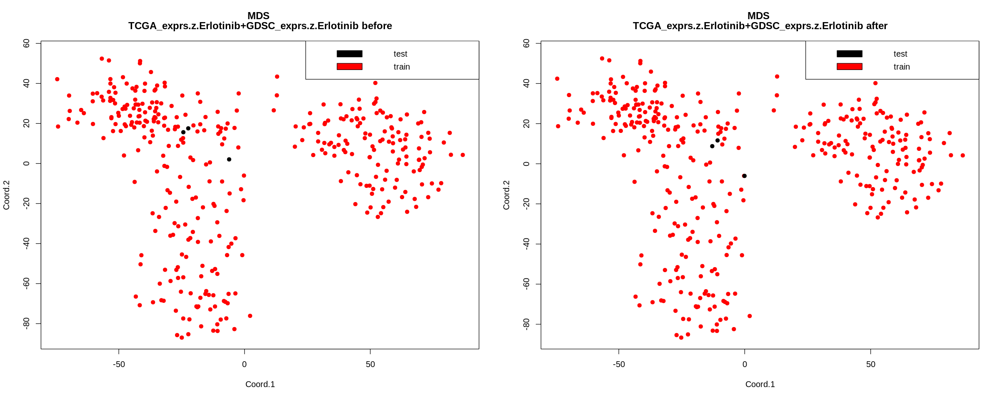

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Cetuximab.eb_with.GDSC_exprs.z.Cetuximab.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Cetuximab.eb_with.TCGA_exprs.z.Cetuximab.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Cisplatin.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Cisplatin.tsv"

 17961  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



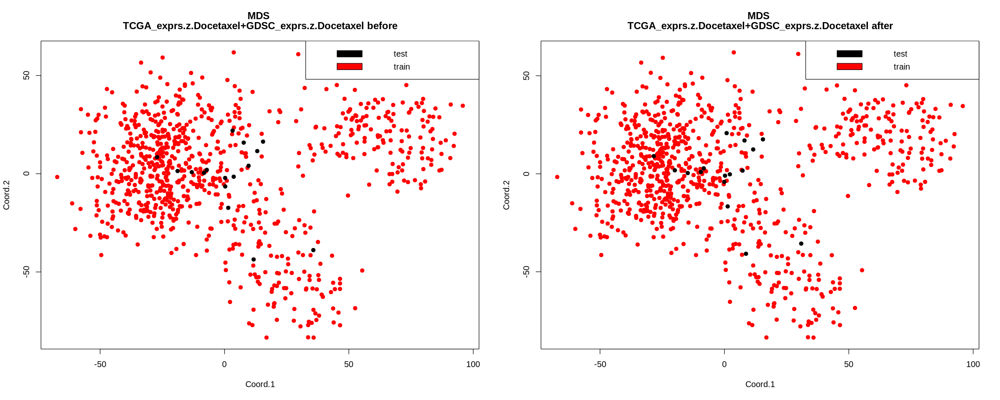

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Cisplatin.eb_with.GDSC_exprs.z.Cisplatin.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Cisplatin.eb_with.TCGA_exprs.z.Cisplatin.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Tamoxifen.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Tamoxifen.tsv"

 18193  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



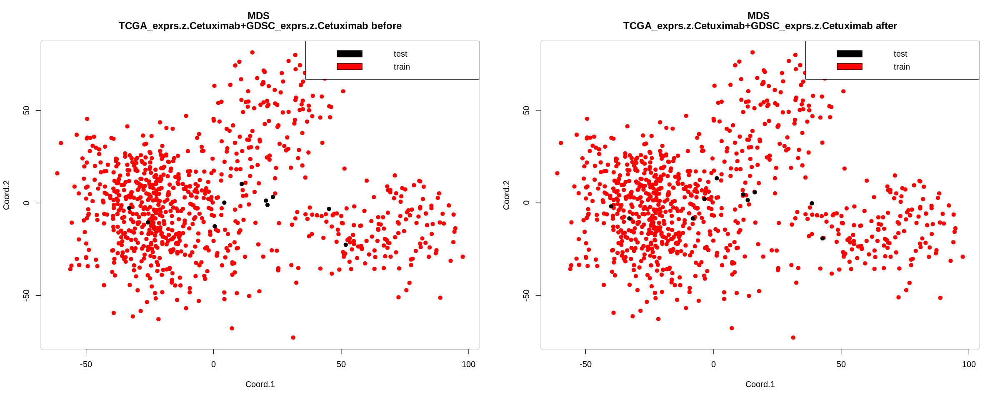

[1] "write results to "                                                                                     
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Tamoxifen.eb_with.GDSC_exprs.z.Tamoxifen.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Tamoxifen.eb_with.TCGA_exprs.z.Tamoxifen.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Paclitaxel.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Paclitaxel.tsv"

 17978  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



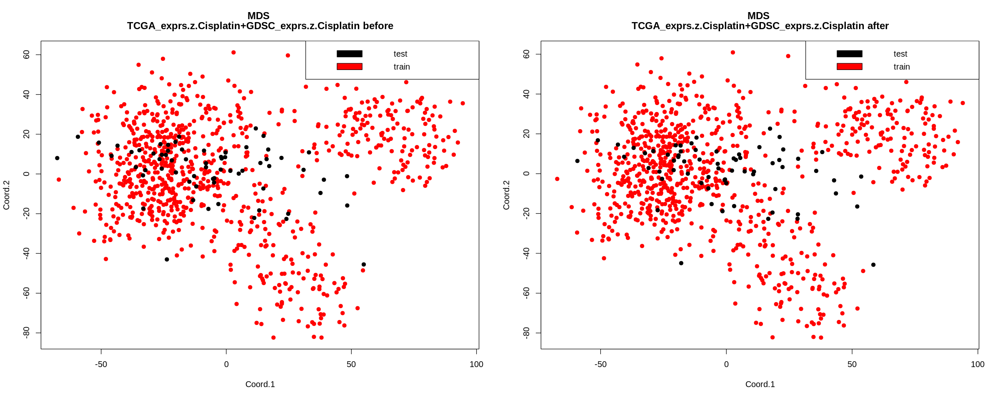

[1] "write results to "                                                                                       
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Paclitaxel.eb_with.GDSC_exprs.z.Paclitaxel.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Paclitaxel.eb_with.TCGA_exprs.z.Paclitaxel.tsv"
[1] "/home/olya/SFU/Hossein/v2//exprs/TCGA_exprs.z.Gemcitabine.tsv"
[2] "/home/olya/SFU/Hossein/v2//exprs/GDSC_exprs.z.Gemcitabine.tsv"

 17934  gene identifiers overlap between the supplied expression matrices... 
 

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



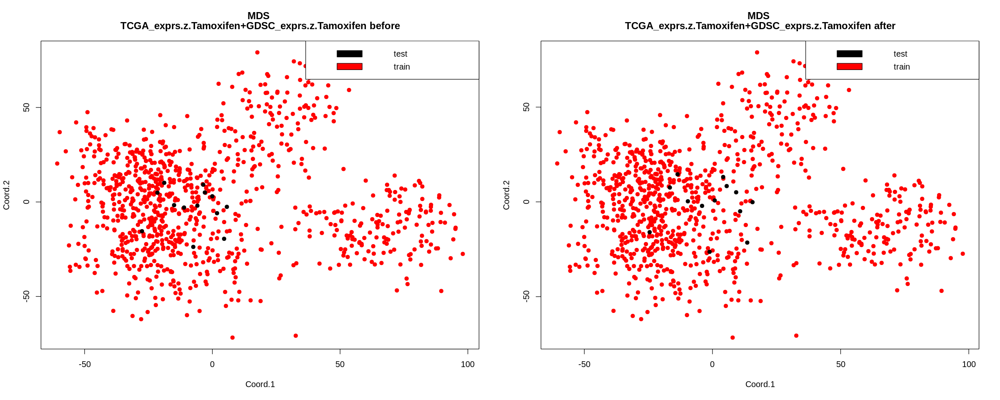

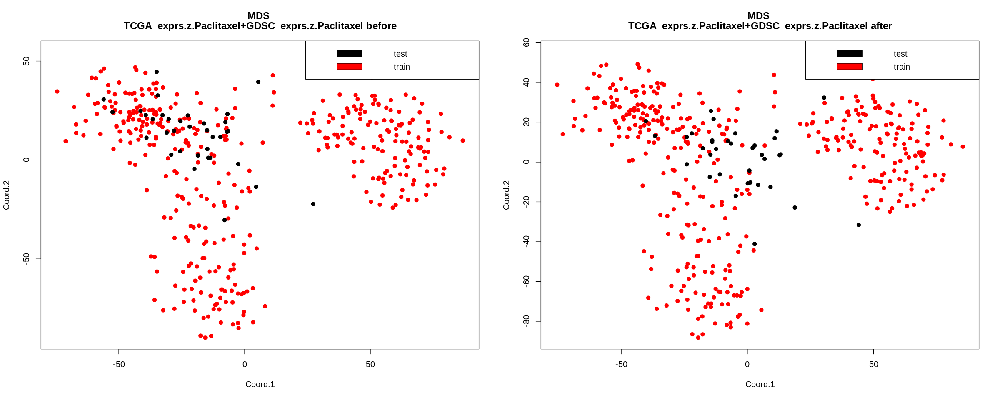

[1] "write results to "                                                                                         
[2] "/home/olya/SFU/Hossein/v2//exprs_homogenized/TCGA_exprs.z.Gemcitabine.eb_with.GDSC_exprs.z.Gemcitabine.tsv"
[3] "/home/olya/SFU/Hossein/v2//exprs_homogenized/GDSC_exprs.z.Gemcitabine.eb_with.TCGA_exprs.z.Gemcitabine.tsv"


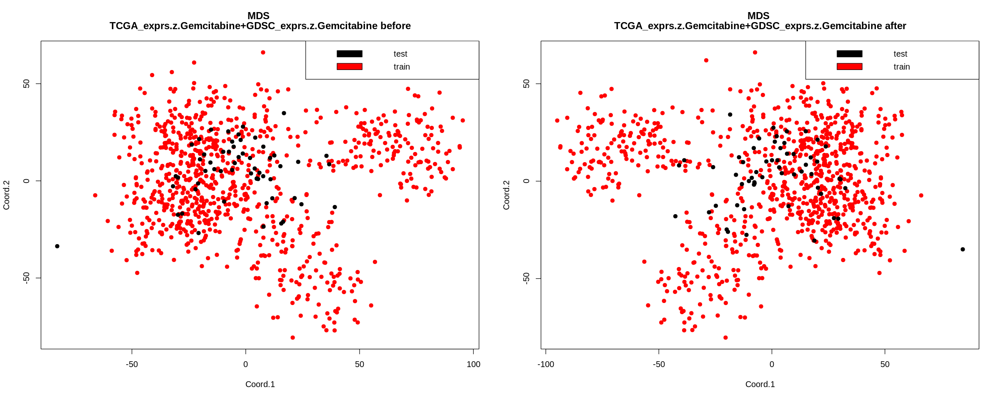

In [7]:
pairs <- list(list("GSE6434_exprs.z.Docetaxel.tsv","GDSC_exprs.z.Docetaxel.tsv"),
            list("GSE18864_exprs.z.Cisplatin.tsv","GDSC_exprs.z.Cisplatin.tsv"),
            list("GSE25065_exprs.z.Docetaxel.tsv","GDSC_exprs.z.Docetaxel.tsv"),
            list("GSE25065_exprs.z.Paclitaxel.tsv","GDSC_exprs.z.Paclitaxel.tsv"),
            list("GSE9782-GPL96_exprs.z.Bortezomib.tsv","GDSC_exprs.z.Bortezomib.tsv"),
            list("GSE9782-GPL97_exprs.z.Bortezomib.tsv","GDSC_exprs.z.Bortezomib.tsv"),
            list("GSE33072_exprs.z.Erlotinib.tsv","GDSC_exprs.z.Erlotinib.tsv"),
            list("PDX_exprs.z.EGFRi.tsv","GDSC_exprs.z.EGFRi.tsv"),
            list("TCGA_exprs.z.EGFRi.tsv","GDSC_exprs.z.EGFRi.tsv"),
            list("PDX_exprs.z.Paclitaxel.tsv","GDSC_exprs.z.Paclitaxel.tsv"),
            list("PDX_exprs.z.Gemcitabine.tsv","GDSC_exprs.z.Gemcitabine.tsv"),
            list("PDX_exprs.z.Erlotinib.tsv","GDSC_exprs.z.Erlotinib.tsv"),
            list("TCGA_exprs.z.Erlotinib.tsv","GDSC_exprs.z.Erlotinib.tsv"),
            list("TCGA_exprs.z.Docetaxel.tsv","GDSC_exprs.z.Docetaxel.tsv"),
            list("TCGA_exprs.z.Cetuximab.tsv","GDSC_exprs.z.Cetuximab.tsv"),
            list("TCGA_exprs.z.Cisplatin.tsv","GDSC_exprs.z.Cisplatin.tsv"),
            list("TCGA_exprs.z.Tamoxifen.tsv","GDSC_exprs.z.Tamoxifen.tsv"),
            list("TCGA_exprs.z.Paclitaxel.tsv","GDSC_exprs.z.Paclitaxel.tsv"),
            list("TCGA_exprs.z.Gemcitabine.tsv","GDSC_exprs.z.Gemcitabine.tsv")
             )

for(pair in pairs){
  testfile <-  paste0(exprs_dir, pair[1])
  trainfile <- paste0(exprs_dir, pair[2])
  print(c(testfile, trainfile))
  homData <-  run_homogenization(testfile, trainfile,
                                 output_dir = output_dir,batch_correction=batch_correction)
}

In [8]:
sessionInfo()

R version 3.5.0 (2018-04-23)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 16.04.5 LTS

Matrix products: default
BLAS/LAPACK: /home/olya/miniconda2/lib/R/lib/libRblas.so

locale:
 [1] LC_CTYPE=en_US.UTF-8          LC_NUMERIC=de_DE.UTF-8       
 [3] LC_TIME=de_DE.UTF-8           LC_COLLATE=en_US.UTF-8       
 [5] LC_MONETARY=de_DE.UTF-8       LC_MESSAGES=en_US.UTF-8      
 [7] LC_PAPER=de_DE.UTF-8          LC_NAME=de_DE.UTF-8          
 [9] LC_ADDRESS=de_DE.UTF-8        LC_TELEPHONE=de_DE.UTF-8     
[11] LC_MEASUREMENT=de_DE.UTF-8    LC_IDENTIFICATION=de_DE.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] preprocessCore_1.38.1 sva_3.24.4            BiocParallel_1.10.1  
[4] genefilter_1.58.1     mgcv_1.8-24           nlme_3.1-137         

loaded via a namespace (and not attached):
 [1] Rcpp_0.12.18         compiler_3.5.0       base64enc_0.1-3     
 [4] bitops_1.0-6         tools